In [1]:
import pandas as pd
import geopandas as gpd
import plotly.express as px
from sodapy import Socrata
import geopandas as gpd
import requests
from pandas.io.json import json_normalize
from geopandas.tools import sjoin

In [2]:
#Creating a socrata client
# connect to the data portal
client = Socrata("data.lacity.org", None)

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("vt5t-mscf",
                    where = "Locarea IN ('WILSHIRE BL', 'LINCOLN BL', '7TH ST (SP)', '7TH ST /W (SP)', '7TH ST /W', '7TH ST /E', '4TH ST', '4TH ST /W (SP)', '4TH ST /W', '4TH ST /E', '5TH ST /W (SP)', '5TH ST /W', '5TH ST /E')", 
                     #locarea ='WILSHIRE BL',#'7TH ST','4TH ST','5TH ST',
                    limit = 5010)

# Convert to pandas DataFrame
df = pd.DataFrame.from_records(results)
# print it with .sample, which gives you random rows
df.sample(2)


,trees_id,trees_id2,locarea,locunit,locsubunit,locsite,spp,common,botanical,on_strt,...,location_1,tg_pg,gisno,x_original,y_original,des_spp1,grow,un,blsd,blsdval
745,417999,37a0979358,5TH ST /E,611,F,3,5,VACANT PLANTING WELL,Vacant well,5TH ST /E,...,"{'latitude': '0.0', 'longitude': '0.0', 'human...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3713,575909,37a098672a8,WILSHIRE BL,3540,F,1,549,DATE PALM,Phoenix dactylifera,WILSHIRE BL,...,"{'latitude': '-118.302', 'longitude': '34.0617...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
df.locarea.value_counts()

WILSHIRE BL       2238
LINCOLN BL         514
5TH ST /W          493
4TH ST /W          413
7TH ST /W          382
4TH ST /E          249
5TH ST /E          215
7TH ST /E          191
5TH ST /W (SP)     130
7TH ST /W (SP)     102
4TH ST /W (SP)      78
4TH ST               1
7TH ST (SP)          1
Name: locarea, dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5007 entries, 0 to 5006
Data columns (total 73 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   trees_id                  5007 non-null   object
 1   trees_id2                 5007 non-null   object
 2   locarea                   5007 non-null   object
 3   locunit                   5007 non-null   object
 4   locsubunit                5007 non-null   object
 5   locsite                   5007 non-null   object
 6   spp                       5007 non-null   object
 7   common                    5007 non-null   object
 8   botanical                 5007 non-null   object
 9   on_strt                   5007 non-null   object
 10  from_strt                 5007 non-null   object
 11  to_strt                   5007 non-null   object
 12  ext                       5007 non-null   object
 13  area                      5007 non-null   object
 14  treeloc                 

In [5]:
df['x'] = df.x.astype(float)
df['y'] = df.y.astype(float)

In [6]:
pdf = df[['trees_id','cd','common','botanical','dbh','x','y']]

In [7]:
xdf = pdf.rename(columns={'x': 'longitude', 'y': 'latitude'})

In [8]:
xdf.sample(5)

,trees_id,cd,common,botanical,dbh,longitude,latitude
3248,449001,4,DEAD TREE,Dead tree,"12 - 18""",-118.355,34.0625
2489,637744,6,GOLD MEDALLION TREE,Cassia leptophylla,"0 - 3""",-118.414,33.9543
4110,666138,9,INDIAN LAUREL FIG,Ficus microcarpa NITIDa,"6 - 12""",-118.256,34.0480
2792,20909,5,INDIAN LAUREL FIG,Ficus microcarpa NITIDa,3-12,-118.444,34.0587
4209,698315,4,AMERICAN SWEETGUM,Liquidambar styraciflua,"3 - 6""",-118.329,34.0620


In [9]:
xdf.isna().any()

trees_id     False
cd            True
common       False
botanical    False
dbh          False
longitude     True
latitude      True
dtype: bool

In [10]:
px.scatter(xdf,
           x='longitude',
           y='latitude'
          )

In [11]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [12]:
xdf.shape

(5007, 7)

In [13]:
xdf.sort_values(by='latitude', ascending = False)

,trees_id,cd,common,botanical,dbh,longitude,latitude
2776,5243,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680
2777,5247,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680
2784,7588,5,RED GUM,EUCALYPTUS CAMALDULENSIS,36-42,-118.425,34.0680
2976,104226,5,AMERICAN SWEETGUM,Liquidambar styraciflua,3-12,-118.425,34.0679
2851,63566,5,MEXICAN FAN PALM,Washingtonia robusta,12-24,-118.425,34.0679
2804,25928,5,CARROTWOOD,Cupaniopsis anacardioides,3-12,-118.425,34.0679
3053,120241,5,AMERICAN SWEETGUM,Liquidambar styraciflua,12-24,-118.425,34.0679
2937,82265,5,CALIFORNIA FAN PALM,Washingtonia filifera,36+,-118.425,34.0679
3052,120227,5,MEXICAN FAN PALM,Washingtonia robusta,12-24,-118.425,34.0679
2975,104196,5,AMERICAN SWEETGUM,Liquidambar styraciflua,3-12,-118.425,34.0679


In [14]:
new = xdf.dropna(subset=['latitude', 'common'])

In [15]:
new.shape
#dropped 5007-4543= 464

(4543, 7)

In [16]:
new.sort_values(by='latitude', ascending = False)

,trees_id,cd,common,botanical,dbh,longitude,latitude
2776,5243,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680
2777,5247,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680
2784,7588,5,RED GUM,EUCALYPTUS CAMALDULENSIS,36-42,-118.425,34.0680
2976,104226,5,AMERICAN SWEETGUM,Liquidambar styraciflua,3-12,-118.425,34.0679
2851,63566,5,MEXICAN FAN PALM,Washingtonia robusta,12-24,-118.425,34.0679
2804,25928,5,CARROTWOOD,Cupaniopsis anacardioides,3-12,-118.425,34.0679
3053,120241,5,AMERICAN SWEETGUM,Liquidambar styraciflua,12-24,-118.425,34.0679
2937,82265,5,CALIFORNIA FAN PALM,Washingtonia filifera,36+,-118.425,34.0679
3052,120227,5,MEXICAN FAN PALM,Washingtonia robusta,12-24,-118.425,34.0679
2975,104196,5,AMERICAN SWEETGUM,Liquidambar styraciflua,3-12,-118.425,34.0679


I have a problem with (0,0) coordinates

In [17]:
#figuring out how to delete trees with latitude 0.00
#new = xdf[~xdf['latitude'].str.contains('0')]

#xdf.drop([130, 313, 126, 125, 127, 128, 129, 397, 192, 61, 60, 
                #1502, 1454, 1235, 1234, 1893, 1908, 1909, 1500, 1501, 1235])
new2 = new.sort_values(by='latitude', ascending = False).reset_index()
new2

,index,trees_id,cd,common,botanical,dbh,longitude,latitude
0,2776,5243,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680
1,2777,5247,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680
2,2784,7588,5,RED GUM,EUCALYPTUS CAMALDULENSIS,36-42,-118.425,34.0680
3,2976,104226,5,AMERICAN SWEETGUM,Liquidambar styraciflua,3-12,-118.425,34.0679
4,2851,63566,5,MEXICAN FAN PALM,Washingtonia robusta,12-24,-118.425,34.0679
5,2804,25928,5,CARROTWOOD,Cupaniopsis anacardioides,3-12,-118.425,34.0679
6,3053,120241,5,AMERICAN SWEETGUM,Liquidambar styraciflua,12-24,-118.425,34.0679
7,2937,82265,5,CALIFORNIA FAN PALM,Washingtonia filifera,36+,-118.425,34.0679
8,3052,120227,5,MEXICAN FAN PALM,Washingtonia robusta,12-24,-118.425,34.0679
9,2975,104196,5,AMERICAN SWEETGUM,Liquidambar styraciflua,3-12,-118.425,34.0679


In [18]:
#new3 = new2.drop([0:2175])

In [19]:
new3 = new2[new2['latitude'] != 0]

In [20]:
new3.shape
#should be 4543-2175-1

(2367, 8)

In [21]:
new3.sort_values(by='latitude', ascending = False)

,index,trees_id,cd,common,botanical,dbh,longitude,latitude
0,2776,5243,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680
2,2784,7588,5,RED GUM,EUCALYPTUS CAMALDULENSIS,36-42,-118.425,34.0680
1,2777,5247,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680
3,2976,104226,5,AMERICAN SWEETGUM,Liquidambar styraciflua,3-12,-118.425,34.0679
5,2804,25928,5,CARROTWOOD,Cupaniopsis anacardioides,3-12,-118.425,34.0679
6,3053,120241,5,AMERICAN SWEETGUM,Liquidambar styraciflua,12-24,-118.425,34.0679
7,2937,82265,5,CALIFORNIA FAN PALM,Washingtonia filifera,36+,-118.425,34.0679
8,3052,120227,5,MEXICAN FAN PALM,Washingtonia robusta,12-24,-118.425,34.0679
9,2975,104196,5,AMERICAN SWEETGUM,Liquidambar styraciflua,3-12,-118.425,34.0679
4,2851,63566,5,MEXICAN FAN PALM,Washingtonia robusta,12-24,-118.425,34.0679


In [22]:
px.scatter(new3,
            x='longitude',
           y='latitude'
          )

In [23]:
new = new3
new.sort_values(by='common', ascending = True)

,index,trees_id,cd,common,botanical,dbh,longitude,latitude
1266,3643,552090,10,AFRICAN FERN PINE,PODOCARPUS GRACILIOR,24-30,-118.313,34.0617
1136,3718,576576,10,AFRICAN FERN PINE,PODOCARPUS GRACILIOR,6-12,-118.300,34.0617
1451,4016,646517,1,ALEPPO PINE,PINUS HALEPENSIS,6-12,-118.282,34.0609
571,3343,495944,4,AMERICAN ELM,Ulmus americana,"18 - 24""",-118.333,34.0621
588,3348,497331,4,AMERICAN ELM,Ulmus americana,"18 - 24""",-118.328,34.0620
471,4171,685715,4,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.356,34.0623
2009,2397,540652,6,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.455,33.9951
2008,2436,601046,6,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.455,33.9951
2007,2401,543221,6,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.455,33.9951
636,4209,698315,4,AMERICAN SWEETGUM,Liquidambar styraciflua,"3 - 6""",-118.329,34.0620


In [24]:
df = new
shade = df[~df['common'].str.contains('PALM')]

In [25]:
#starting at 2367 now at 2016, 351 out
shade.shape

(2016, 8)

In [26]:
shade[shade['common'].str.contains('NULL')]

,index,trees_id,cd,common,botanical,dbh,longitude,latitude
19,2773,3584,5,NULL,NULL,12-24,-118.427,34.0676
1488,2772,366,5,NULL,NULL,0-3,-118.437,34.0606


In [27]:
shade = shade[~shade['common'].str.contains('NULL')]
shade.shape

(2014, 8)

In [28]:
shade = shade[~shade['common'].str.contains('OTHER')]
shade.shape

(2009, 8)

In [29]:
shade.sort_values(by='common', ascending = True)

,index,trees_id,cd,common,botanical,dbh,longitude,latitude
1266,3643,552090,10,AFRICAN FERN PINE,PODOCARPUS GRACILIOR,24-30,-118.313,34.0617
1136,3718,576576,10,AFRICAN FERN PINE,PODOCARPUS GRACILIOR,6-12,-118.300,34.0617
1451,4016,646517,1,ALEPPO PINE,PINUS HALEPENSIS,6-12,-118.282,34.0609
571,3343,495944,4,AMERICAN ELM,Ulmus americana,"18 - 24""",-118.333,34.0621
588,3348,497331,4,AMERICAN ELM,Ulmus americana,"18 - 24""",-118.328,34.0620
2009,2397,540652,6,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.455,33.9951
2008,2436,601046,6,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.455,33.9951
2007,2401,543221,6,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.455,33.9951
480,4170,685712,4,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.356,34.0623
471,4171,685715,4,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.356,34.0623


In [30]:
shade = shade[~shade['common'].str.contains('VACANT')]
shade.shape

(1859, 8)

In [31]:
shade.sort_values(by='common', ascending = True)

,index,trees_id,cd,common,botanical,dbh,longitude,latitude
1266,3643,552090,10,AFRICAN FERN PINE,PODOCARPUS GRACILIOR,24-30,-118.313,34.0617
1136,3718,576576,10,AFRICAN FERN PINE,PODOCARPUS GRACILIOR,6-12,-118.300,34.0617
1451,4016,646517,1,ALEPPO PINE,PINUS HALEPENSIS,6-12,-118.282,34.0609
571,3343,495944,4,AMERICAN ELM,Ulmus americana,"18 - 24""",-118.333,34.0621
588,3348,497331,4,AMERICAN ELM,Ulmus americana,"18 - 24""",-118.328,34.0620
2009,2397,540652,6,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.455,33.9951
2008,2436,601046,6,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.455,33.9951
2007,2401,543221,6,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.455,33.9951
480,4170,685712,4,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.356,34.0623
471,4171,685715,4,AMERICAN SWEETGUM,Liquidambar styraciflua,"6 - 12""",-118.356,34.0623


In [32]:
px.scatter(shade,
            x='longitude',
           y='latitude'
          )

In [33]:
px.bar(shade,
       x='cd',
       title='Number of shade trees by Council Districts',
       labels={'cd':'Council Districts','count':'Number of shade trees'}
      )

In [34]:
#gdf = GeoDataFrame(, crs="EPSG:4326", geometry=geometry)

In [35]:


trees = gpd.GeoDataFrame(df, 
                        crs="EPSG:4326",
                        geometry=gpd.points_from_xy(x=df.longitude, y=df.latitude))


In [36]:
trees.head()

,index,trees_id,cd,common,botanical,dbh,longitude,latitude,geometry
0,2776,5243,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680,POINT (-118.42500 34.06800)
1,2777,5247,5,CALIFORNIA SYCAMORE,PLATANUS RACEMOSA,NULL,-118.425,34.0680,POINT (-118.42500 34.06800)
2,2784,7588,5,RED GUM,EUCALYPTUS CAMALDULENSIS,36-42,-118.425,34.0680,POINT (-118.42500 34.06800)
3,2976,104226,5,AMERICAN SWEETGUM,Liquidambar styraciflua,3-12,-118.425,34.0679,POINT (-118.42500 34.06790)
4,2851,63566,5,MEXICAN FAN PALM,Washingtonia robusta,12-24,-118.425,34.0679,POINT (-118.42500 34.06790)


In [37]:
trees.shape

(2367, 9)

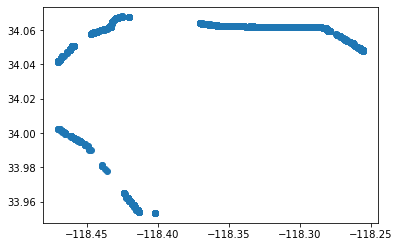

In [38]:
trees.plot()

In [39]:
benches=gpd.read_file('../gdata/Bus_Stop_Benches.shp')

In [40]:
url = "https://api.metro.net/agencies/lametro/routes/20/stops/"
stops = pd.read_json(url)
stops

,items
0,"{'id': '08461', 'display_name': 'Wilshire / Se..."
1,"{'id': '16721', 'display_name': 'Wilshire / Fl..."
2,"{'id': '16743', 'display_name': 'Wilshire / Re..."
3,"{'id': '08399', 'display_name': 'Wilshire / Li..."
4,"{'id': '16765', 'display_name': 'Wilshire / Se..."
5,"{'id': '08392', 'display_name': 'Wilshire / Co..."
6,"{'id': '02316', 'display_name': 'Gayley / Le C..."
7,"{'id': '08390', 'display_name': 'Wilshire / Br..."
8,"{'id': '08444', 'display_name': 'Wilshire / Re..."
9,"{'id': '16741', 'display_name': 'Wilshire / Pa..."


In [41]:
stops = pd.DataFrame(stops['items'].tolist())
stops

,id,display_name,latitude,longitude
0,08461,Wilshire / Selby,34.06019,-118.43808
1,16721,Wilshire / Flower,34.04936,-118.25836
2,16743,Wilshire / Rexford,34.06720,-118.39432
3,08399,Wilshire / Lincoln,34.02229,-118.49416
4,16765,Wilshire / Selby,34.06050,-118.43785
5,08392,Wilshire / Comstock,34.06785,-118.42553
6,02316,Gayley / Le Conte,34.06403,-118.44806
7,08390,Wilshire / Brockton,34.04574,-118.46523
8,08444,Wilshire / Rexford,34.06695,-118.39407
9,16741,Wilshire / Park View,34.05975,-118.27932


In [42]:
#stopsgdf = geopandas.GeoDataFrame(
  # stops, geometry=geopandas.points_from_xy(x=stops.longitude, y=stops.latitude))

stopsgdf = gpd.GeoDataFrame(stops, 
                        crs="EPSG:4326",
                        geometry=gpd.points_from_xy(x=stops.longitude, y=stops.latitude))

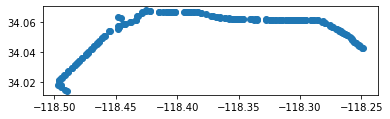

In [43]:
stopsgdf.plot()

In [44]:
#trees , benches, and stops
stops.head(5)

,id,display_name,latitude,longitude,geometry
0,08461,Wilshire / Selby,34.06019,-118.43808,POINT (-118.43808 34.06019)
1,16721,Wilshire / Flower,34.04936,-118.25836,POINT (-118.25836 34.04936)
2,16743,Wilshire / Rexford,34.06720,-118.39432,POINT (-118.39432 34.06720)
3,08399,Wilshire / Lincoln,34.02229,-118.49416,POINT (-118.49416 34.02229)
4,16765,Wilshire / Selby,34.06050,-118.43785,POINT (-118.43785 34.06050)


In [45]:
# libraries

import matplotlib.pyplot as plt

# for basemaps
import contextily as ctx

In [46]:
# reproject the data
stopsgdf = stopsgdf.to_crs('EPSG:3857')
trees = trees.to_crs('EPSG:3857')

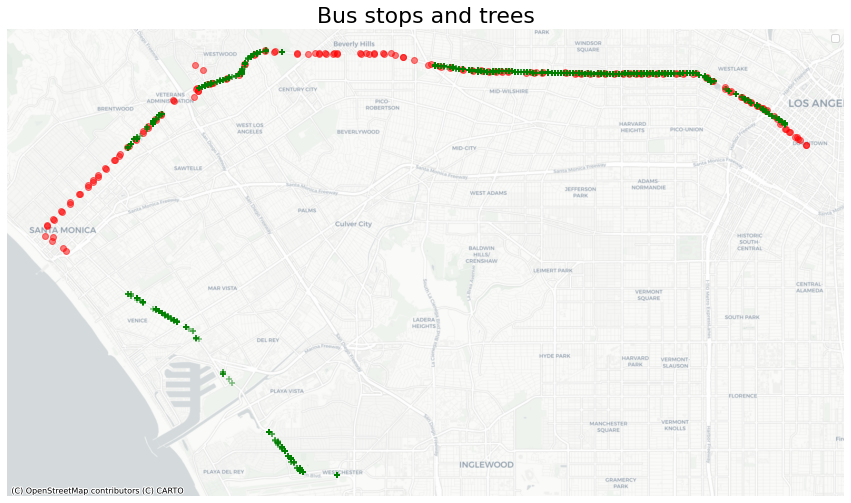

In [47]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
stopsgdf.plot(ax=ax,
         legend=True,
         alpha=0.5,
         color='red')

trees.plot(ax=ax, 
             color='green',
             marker = '+',
             alpha=0.5, 
             legend=True)

ax.axis('off')
ax.legend()
ax.set_title('Bus stops and trees',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

<div class="alert alert-danger">
Here is your buffer!
</div>

In [48]:
stop_buffer = stopsgdf.buffer(500)

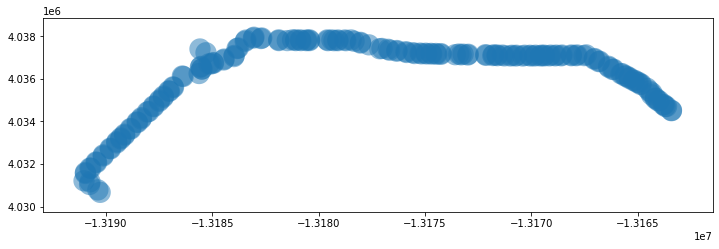

In [49]:
stop_buffer.plot(figsize=(12,12),alpha=0.5)

In [50]:
stop_buffer.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [51]:
trees.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [52]:
#Since we have both data in same projection, we could try to do a spatial join. 
#Ultimately I want all rows of bus stops to remain.

In [53]:
stop_buffer.dtype

In [54]:
stop_buffer.head()

0    POLYGON ((-13183966.745 4036886.939, -13183969...
1    POLYGON ((-13163960.417 4035431.795, -13163962...
2    POLYGON ((-13179095.404 4037828.917, -13179097...
3    POLYGON ((-13190209.553 4031795.408, -13190211...
4    POLYGON ((-13183941.153 4036928.580, -13183943...
dtype: geometry

In [55]:
#Looks like our buffer dataframe needs to be converted to geodataframe

In [56]:
newgdf = gpd.GeoDataFrame(geometry=gpd.GeoSeries(stop_buffer))

In [57]:
newgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 183 entries, 0 to 182
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  183 non-null    geometry
dtypes: geometry(1)
memory usage: 1.6 KB


In [58]:
newgdf.shape

(183, 1)

In [59]:
newgdf.head()

,geometry
0,"POLYGON ((-13183966.745 4036886.939, -13183969..."
1,"POLYGON ((-13163960.417 4035431.795, -13163962..."
2,"POLYGON ((-13179095.404 4037828.917, -13179097..."
3,"POLYGON ((-13190209.553 4031795.408, -13190211..."
4,"POLYGON ((-13183941.153 4036928.580, -13183943..."


In [60]:
newgdf.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [61]:
newgdf.shape

(183, 1)

In [62]:
trees.shape

(2367, 9)

In [63]:
join = gpd.sjoin(newgdf, trees, how='left') #we want each bus stop buffer to be a row, 
#so take data fro right column to newgdf column

In [64]:
join.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 11992 entries, 0 to 182
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   geometry     11992 non-null  geometry
 1   index_right  11932 non-null  float64 
 2   index        11932 non-null  float64 
 3   trees_id     11932 non-null  object  
 4   cd           11932 non-null  object  
 5   common       11932 non-null  object  
 6   botanical    11932 non-null  object  
 7   dbh          11932 non-null  object  
 8   longitude    11932 non-null  float64 
 9   latitude     11932 non-null  float64 
dtypes: float64(4), geometry(1), object(5)
memory usage: 1.0+ MB


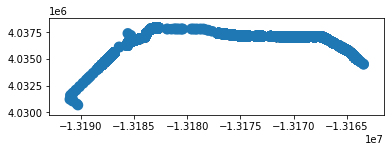

In [65]:
join.plot()

In [66]:
join.tail()

,geometry,index_right,index,trees_id,cd,common,botanical,dbh,longitude,latitude
180,"POLYGON ((-13167627.281 4037087.140, -13167629...",1084.0,4512.0,794838,10,INDIAN LAUREL FIG,Ficus microcarpa NITIDa,"12 - 18""",-118.294,34.0618
180,"POLYGON ((-13167627.281 4037087.140, -13167629...",1025.0,4673.0,795176,10,INDIAN LAUREL FIG,Ficus microcarpa NITIDa,"12 - 18""",-118.294,34.0618
180,"POLYGON ((-13167627.281 4037087.140, -13167629...",904.0,3648.0,552870,10,INDIAN LAUREL FIG,Ficus microcarpa NITIDa,"12 - 18""",-118.294,34.0618
181,"POLYGON ((-13162922.908 4034503.436, -13162925...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
182,"POLYGON ((-13177976.654 4037827.560, -13177979...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
#Come back to this for finals:
#Stops 180 appears three times (or more) in our spatial join instead of once. Not sure why that's the case.
#Is this because the join creates new rows for every tree in a buffer? or is it because our buffers overlap? or both?
#Also, I realized that in the buffer layer and the new join layer, I am not able to see name of these bus stops...

In [68]:
#For W-10 assignment, start from here. We want to start with a KDE plot for benches in the city of LA. 

In [69]:

import seaborn as sns
from pointpats import centrography
from matplotlib.patches import Ellipse
import numpy
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

In [70]:
benches = benches.to_crs('EPSG:3857')

In [71]:
#Because sns requirs having separate x and y columns
benches['x'] = benches.geometry.x
benches['y'] = benches.geometry.y

In [72]:
benches.head()

,OBJECTID,FID2,NUMBER,LATITUDE,LONGITUDE,SITEATS,CITY_SITE,FACING,MEDIA_TYPE,UNIT_TYPE,AREA,ADVERTISER,TOOLTIP,geometry,x,y
0,1,663,LA-0664,34.19462,-118.58843,NB De Soto FS Vanowen -NE,L.A. Valley West,South,Bus Bench,Recycle Plastic,CD-03,MOM L.A.,Location: NB De Soto FS Vanowen -NE\nNumber...,POINT (-13201202.277 4054964.117),-1.320120e+07,4.054964e+06
1,2,681,LA-0682,34.20065,-118.62340,SB Fallbrook FS Sherman Way -SW,L.A. Valley West,East,Bus Bench,Recycle Plastic,CD-03,Jerry Gooze,Location: SB Fallbrook FS Sherman Way -SW\n...,POINT (-13205095.119 4055775.692),-1.320510e+07,4.055776e+06
2,3,682,LA-0683,34.20065,-118.62340,SB Fallbrook FS Sherman Way -SW,L.A. Valley West,East,Bus Bench,Recycle Plastic,CD-03,Jerry Gooze,Location: SB Fallbrook FS Sherman Way -SW\n...,POINT (-13205095.119 4055775.692),-1.320510e+07,4.055776e+06
3,4,711,LA-0712,34.15238,-118.60487,EB Mulholland D NS Topanga -SW,L.A. Valley West,East,Bus Bench,Recycle Plastic,CD-03,MOM L.A.,Location: EB Mulholland D NS Topanga -SW\nN...,POINT (-13203032.370 4049280.684),-1.320303e+07,4.049281e+06
4,5,771,LA-0772,34.21597,-118.53582,NB Reseda Blvd FS Strathern -NE,L.A. Valley West,South,Bus Bench,Recycle Plastic,CD-03,MOM L.A.,Location: NB Reseda Blvd FS Strathern -NE\nN...,POINT (-13195345.760 4057837.864),-1.319535e+07,4.057838e+06


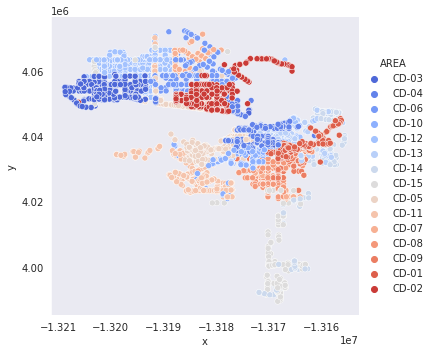

In [93]:
# to map benches by council districts
sns.relplot(data=benches,
            x='x', 
            y='y',
            hue='AREA',
            palette='coolwarm')

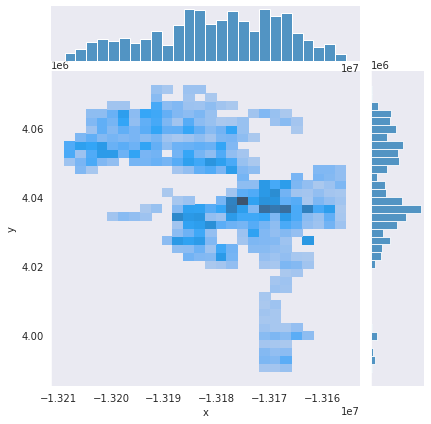

In [97]:
#Analysis 1: hist plot
sns.jointplot(data = benches,
              x='x', 
              y='y', 
              kind='hist')

In [92]:
benches.AREA.value_counts()

CD-05    613
CD-12    612
CD-03    588
CD-11    587
CD-04    401
CD-02    394
CD-10    361
CD-13    278
CD-06    273
CD-15    250
CD-01    221
CD-14    212
CD-08    212
CD-09    182
CD-07    148
Name: AREA, dtype: int64

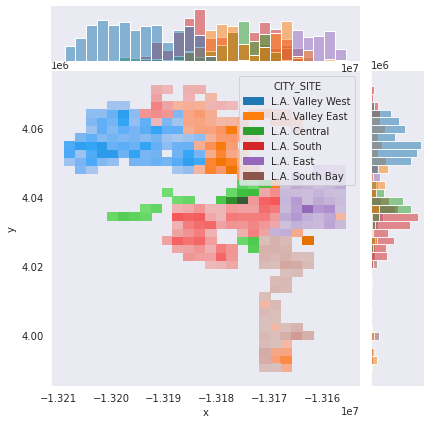

In [99]:
# Let's try kde plots by council districts
sns.jointplot(data = benches,
              x='x', 
              y='y', 
              kind='hist',
              hue='CITY_SITE')

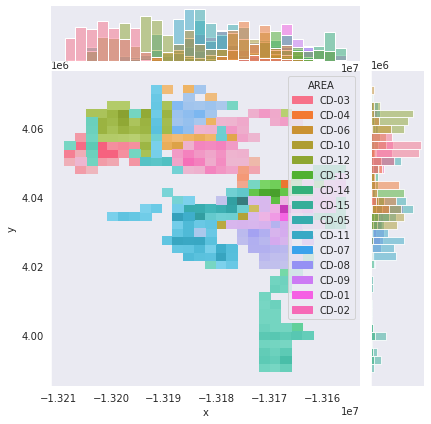

In [100]:
sns.jointplot(data = benches,
              x='x', 
              y='y', 
              kind='hist',
              hue='AREA')

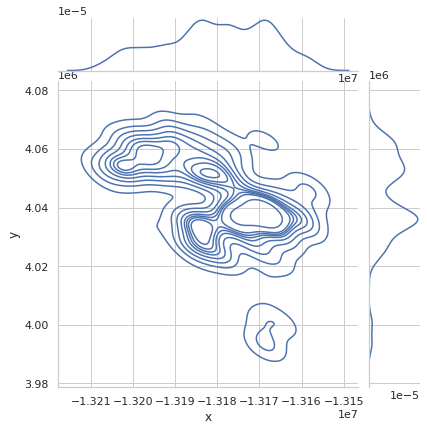

In [104]:
#Analysis 2: KDE plot
sns.jointplot(data = benches,
              x='x', 
              y='y', 
              kind='kde')

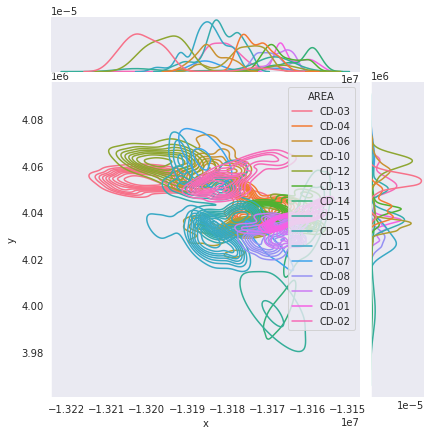

In [101]:

sns.jointplot(data = benches,
              x='x', 
              y='y', 
              kind='kde',
              hue='AREA')

In [76]:
#The kde plots by council district does not tell any particular story here. Let's move to a centrography analysis

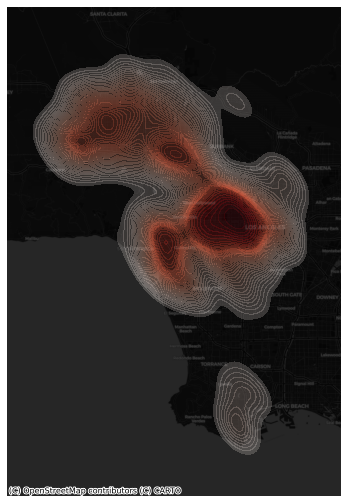

In [77]:
f, ax = plt.subplots(1, figsize=(9, 9))

# kdeplot, i.e. heat map
sns.kdeplot(x = benches.x, 
            y = benches.y,
            n_levels=50, 
            shade=True,
            thresh=0.05,
            alpha=0.2, 
            cmap='Reds')

# axes
ax.axis('off')

# basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)

In [78]:
#This maps shows some form of concentration of benches at east+west side of LA, and downtown too it seems 

In [79]:
#Next, we look at centrography-where is the global center of our data?

In [80]:
mean_center = centrography.mean_center(benches[['x','y']])
med_center = centrography.euclidean_median(benches[['x','y']])

In [81]:
major, minor, rotation = centrography.ellipse(benches[['x','y']])

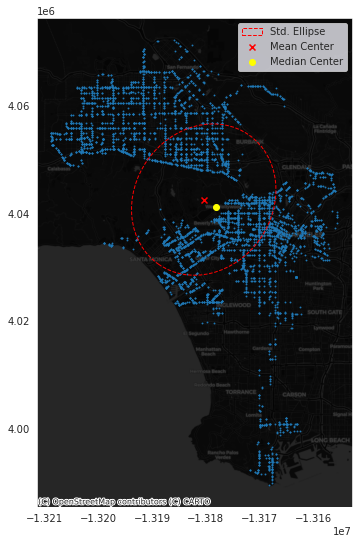

In [82]:
sns.set_style('dark')
f, ax = plt.subplots(1, figsize=(9, 9))
ax.scatter(benches['x'], benches['y'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
ax.scatter(*med_center, color='yellow', marker='o', label='Median Center')

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                  width=major*2, # centrography.ellipse only gives half the axis
                  height=minor*2, 
                  angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                  facecolor='none', 
                  edgecolor='red', linestyle='--',
                  label='Std. Ellipse')

ax.add_patch(ellipse)

ax.legend()

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)

# Display
plt.show()

*Data Interpretation*
Central tendencies of benches data show that the mean center for bus stop benches is around West hollywood 
The median center of benches data is also close to West Hollywood
We think that this close proximity between our mean center and median center also suggests smaller variations and 
less outliers in our dataset.
The direction of our ellipse is diagonal, but we'd have to do analysis by slice to learn more.

In [86]:
@interact
def benches_ellipse(AREA=benches.AREA.unique().tolist()):
    # filter the data by AREA
    bench_filtered = benches[benches.AREA == AREA]

    # mean center and median
    mean_center = centrography.mean_center(bench_filtered[['x','y']])
    med_center = centrography.euclidean_median(bench_filtered[['x','y']])

    # standard ellipse
    major, minor, rotation = centrography.ellipse(bench_filtered[['x','y']])

    # Set up figure and axis
    f, ax = plt.subplots(1, figsize=(9, 9))

    # plot arrest points
    ax.scatter(bench_filtered['x'], bench_filtered['y'], s=0.75)

    # add the mean and median center points
    ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
    ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

    # heatmap
    sns.kdeplot(x = bench_filtered.geometry.x, 
                y = bench_filtered.geometry.y,
                n_levels=20, 
                shade=False,
                thresh=0.1,
                alpha=0.3, 
                cmap='Reds', 
                ax=ax)

    # Construct the standard ellipse using matplotlib
    ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                      width=major*2, # centrography.ellipse db_filtered
                      height=minor*2, 
                      angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                      facecolor='none', 
                      edgecolor='red', linestyle='--',
                      label='Std. Ellipse')

    ax.add_patch(ellipse)

    ax.legend()

    ax.axis('Off')

    # add a basemap
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)
    # Display
    plt.show()

interactive(children=(Dropdown(description='AREA', options=('CD-03', 'CD-04', 'CD-06', 'CD-10', 'CD-12', 'CD-1…

In [84]:
#Notice that orientation may not give as much information when we slice data by CD.

For cd-04, the mean and median are fairly close to each other, and there is no particular orientation of the ellipse for benches.
For cd-05, mean and median center are much apart, and overall tendency for the data is slightly diagonal with lots of points on the south side of CD-05
For cd-11, mean and median center are much apart, and ellipse is oriented diagonally and to the left
For cd-13, mean and median center are much apart, and ellipse is oriented diagonally and to the left
A common theme from these visualizations is the uneven distribution of benches, esp given the orientation of ellipses in 4 CDs. 

In [85]:
#HW says to add interpretation of data-not sure if the text above suffice as interpretations....

In [ ]:
#Please see another notebook called W10-Parttwo as continuation to our assignment

*Division of labor*: Isabel worked on hist plot, KDE plots, and dbh analysis. 
Sami worked on centrography, elipses, and KDE plots. 